<a href="https://colab.research.google.com/github/CaptKeroro/CaptKeroro/blob/main/penyakitPadaKentang.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install tensorflow
!pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 71.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 89.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 87.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 92.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 19.8 MB/s eta 0:00:00


In [2]:
from PIL import Image
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout
import cv2
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
import matplotlib.pyplot as plt
import io
from google.colab import files

# 1. Import Data

In [3]:
def load_images(directory):
    images = []
    for filename in os.listdir(directory):

          img = Image.open(os.path.join(directory, filename))
          img = img.resize((224, 224))
          img = img.convert('RGB')
          img = np.array(img) / 255.0
          images.append(img)
    return images

link drive: https://drive.google.com/drive/folders/137cVytieW1Y65VbDAQasB4mu3El_0qQ5?usp=drive_link

In [4]:
from google.colab import drive
drive.mount('/content/drive')

potato_early_blight = "/content/drive/MyDrive/Colab Notebooks/dataset/penyakit pada kentang/Potato___Early_blight"
potato_late_blight = "/content/drive/MyDrive/Colab Notebooks/dataset/penyakit pada kentang/Potato___Late_blight"
potato_healthy = "/content/drive/MyDrive/Colab Notebooks/dataset/penyakit pada kentang/Potato___healthy"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
early_blight_images = load_images(potato_early_blight)
late_blight_images = load_images(potato_late_blight)
healthy_images = load_images(potato_healthy)

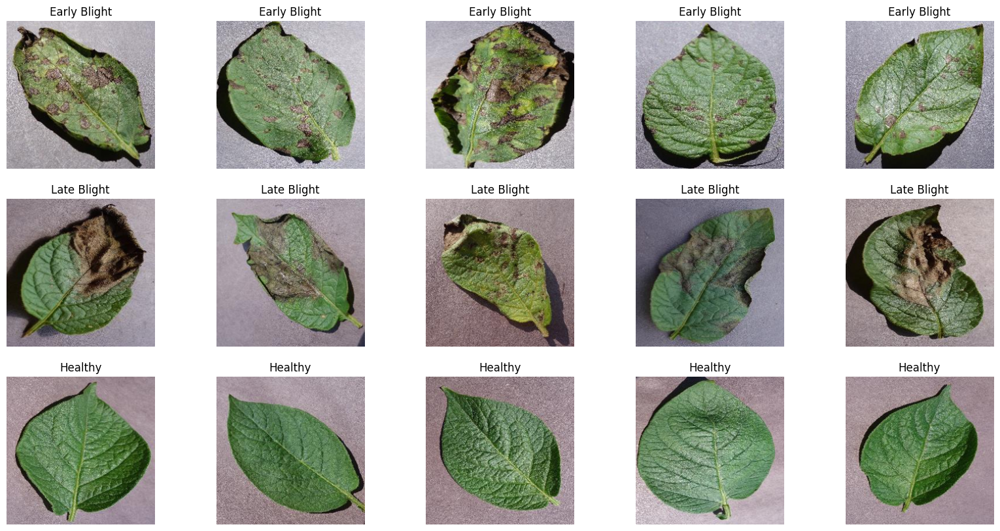

In [6]:
fig, axes = plt.subplots(3, 5, figsize=(20, 10))

for i in range(5):
  axes[0, i].imshow(early_blight_images[i])
  axes[0, i].set_title("Early Blight")
  axes[0, i].axis('off')

for i in range(5):
  axes[1, i].imshow(late_blight_images[i])
  axes[1, i].set_title("Late Blight")
  axes[1, i].axis('off')

for i in range(5):
  axes[2, i].imshow(healthy_images[i])
  axes[2, i].set_title("Healthy")
  axes[2, i].axis('off')

plt.show()

In [7]:
type(early_blight_images)

list

In [8]:
len(early_blight_images)

1000

In [9]:
len(healthy_images)

152

In [10]:
len(late_blight_images)

1000

In [11]:
late_blight_images, early_blight_images, healthy_images

([array([[[0.49803922, 0.44705882, 0.48235294],
          [0.52156863, 0.47058824, 0.50588235],
          [0.55294118, 0.50196078, 0.5372549 ],
          ...,
          [0.68235294, 0.63921569, 0.67058824],
          [0.69411765, 0.65098039, 0.68235294],
          [0.71372549, 0.67058824, 0.70196078]],
  
         [[0.51372549, 0.4627451 , 0.49803922],
          [0.5254902 , 0.4745098 , 0.50980392],
          [0.5372549 , 0.48627451, 0.52156863],
          ...,
          [0.69803922, 0.65490196, 0.68627451],
          [0.70980392, 0.66666667, 0.69803922],
          [0.71764706, 0.6745098 , 0.70588235]],
  
         [[0.54901961, 0.49803922, 0.53333333],
          [0.54509804, 0.49411765, 0.52941176],
          [0.54509804, 0.49411765, 0.52941176],
          ...,
          [0.70588235, 0.6627451 , 0.69411765],
          [0.70980392, 0.66666667, 0.69803922],
          [0.71372549, 0.67058824, 0.70196078]],
  
         ...,
  
         [[0.50196078, 0.45490196, 0.50980392],
          [0.5

# 2. Labeling

In [12]:
def assign_labels(early_blight_images, late_blight_images, healthy_images):
    early_blight_labels = np.ones(len(early_blight_images))
    late_blight_labels = np.full(len(late_blight_images), 2)
    healthy_labels = np.zeros(len(healthy_images))
    return early_blight_labels, late_blight_labels, healthy_labels
early_blight_labels, late_blight_labels, healthy_labels = assign_labels(early_blight_images, late_blight_images, healthy_images)

In [13]:
data = early_blight_images + late_blight_images + healthy_images
labels = np.concatenate((early_blight_labels, late_blight_labels, healthy_labels), axis=0)

In [14]:
data[0].shape

(224, 224, 3)

# 3. Spliting Data

In [15]:
X = np.array(data)
y = np.array(labels)

In [16]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [17]:
train = tf.data.Dataset.from_tensor_slices((X_train, y_train))
test = tf.data.Dataset.from_tensor_slices((X_test, y_test))

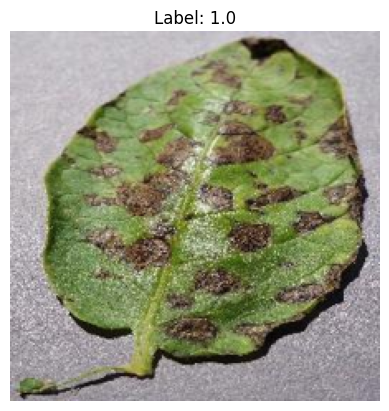

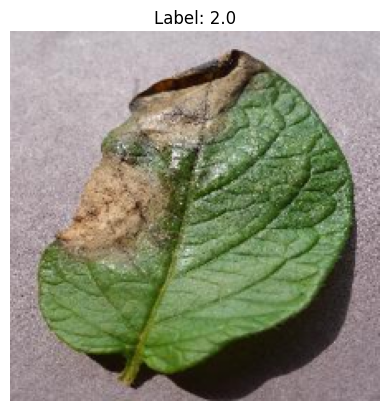

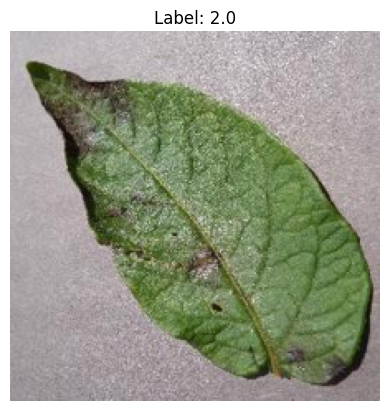

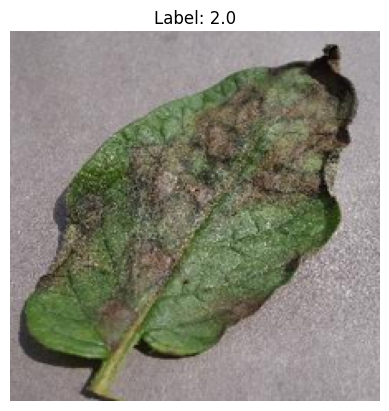

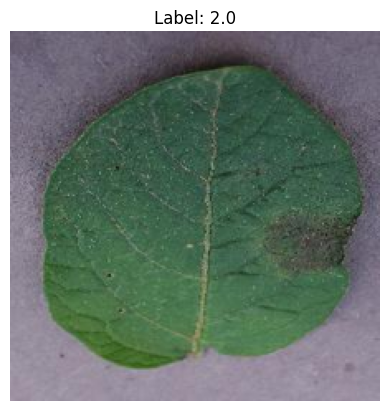

In [18]:
for image, label in train.take(5):
    plt.figure()
    plt.imshow(image.numpy())
    plt.title('Label: {}'.format(label.numpy()))
    plt.axis('off')
    plt.show()

In [19]:
validation_size = int(0.1 * 202)
train = train.skip(validation_size)
val = train.take(validation_size)

In [20]:
BATCH_SIZE = 32
train = train.batch(BATCH_SIZE)
test = test.batch(BATCH_SIZE)
val = val.batch(BATCH_SIZE)

# 4. Training Data

In [21]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models

# Load base model tanpa top classifier
base_model = MobileNetV2(input_shape=(224, 224, 3),
                         include_top=False,
                         weights='imagenet')
base_model.trainable = False  # Freeze dulu untuk transfer learning

# Bangun model di atas base MobileNetV2
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(3, activation='softmax')  # Klasifikasi 3 kelas
])

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [22]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [23]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,339 (9.24 MB)

 Trainable params: 164,355 (642.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [24]:
history = model.fit(train, validation_data=val, epochs=10, verbose=1)

Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - accuracy: 0.8096 - loss: 0.4855 - val_accuracy: 0.9000 - val_loss: 0.2536
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 103s 2s/step - accuracy: 0.9585 - loss: 0.1219 - val_accuracy: 0.9000 - val_loss: 0.1551
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 102s 2s/step - accuracy: 0.9796 - loss: 0.0715 - val_accuracy: 0.9000 - val_loss: 0.0972
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - accuracy: 0.9780 - loss: 0.0511 - val_accuracy: 0.9500 - val_loss: 0.0757
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 102s 2s/step - accuracy: 0.9911 - loss: 0.0360 - val_accuracy: 1.0000 - val_loss: 0.0540
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - accuracy: 0.9935 - loss: 0.0264 - val_accuracy: 0.9500 - val_loss: 0.0649
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 102s 2s/step - accuracy: 0.9945 - loss: 0.0219 - val_accuracy: 0.9000 - val_loss: 0.0971
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - accuracy: 0.9904 - loss: 0.0280 - val_accuracy: 1.0000 - v

In [25]:
evaluation = model.evaluate(test)

14/14 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.9935 - loss: 0.0205


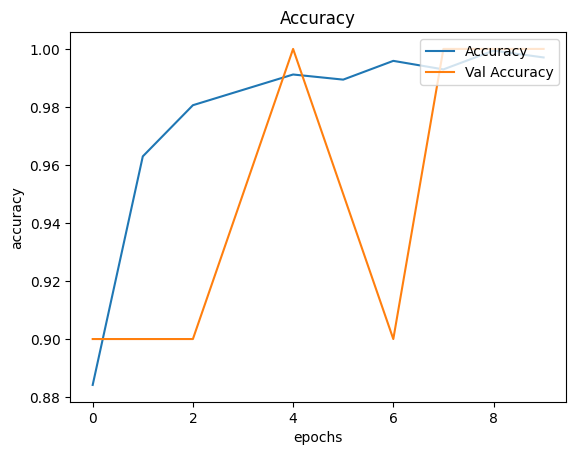

In [26]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.legend(['Accuracy', 'Val Accuracy'], loc = 'upper right')
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.show()

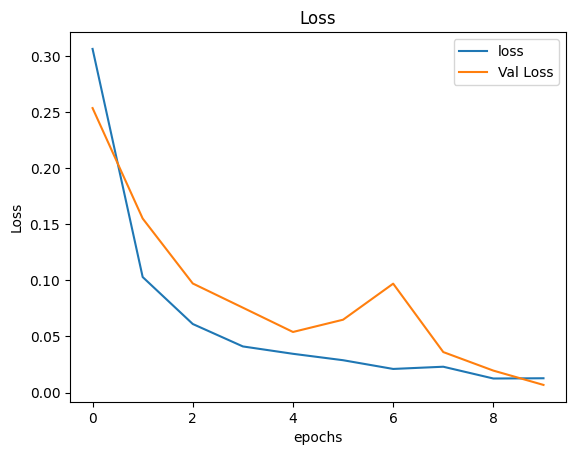

In [27]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['loss', 'Val Loss'], loc = 'upper right')
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('Loss')
plt.show()

# 5. Testing

In [28]:
model.save('/content/drive/MyDrive/Colab Notebooks/dataset/penyakit pada kentang/penyakitPadaKentang.h5')

In [29]:
def load_uploaded_image(image_bytes):
    img = Image.open(io.BytesIO(image_bytes))
    img = img.resize((224, 224))
    img_array = np.array(img)
    img_array = img_array / 255.0
    return img_array

def predict_image(image_bytes):
    img_array = load_uploaded_image(image_bytes)
    img_array = np.expand_dims(img_array, axis=0)
    prediction = model.predict(img_array)
    pred_class = np.argmax(prediction[0])

    # mapping indeks ke label
    if pred_class == 0:
        return "Healthy"
    elif pred_class == 1:
        return "Early Blight"
    else:
        return "Late Blight"

Saving 0a47f32c-1724-4c8d-bfe4-986cedd3587b___RS_Early.B 8001.JPG to 0a47f32c-1724-4c8d-bfe4-986cedd3587b___RS_Early.B 8001.JPG


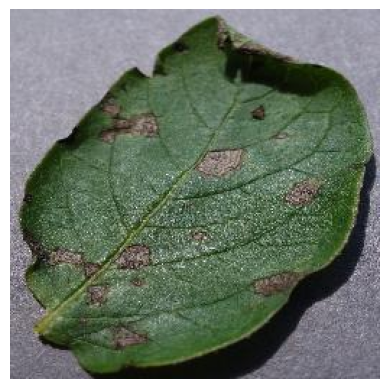

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Hasil Prediksi: Early Blight


In [30]:
uploaded = files.upload()
file_name = list(uploaded.keys())[0]
image_bytes = uploaded[file_name]

img = Image.open(io.BytesIO(image_bytes))
plt.imshow(img)
plt.axis('off')
plt.show()

result = predict_image(image_bytes)
print("Hasil Prediksi:", result)